# Oct 7th, 2022 (Linear: STA -- draft)

**Motivation**: Characterize STA for all cells. <br>

In [1]:
# HIDE CODE


import os
import sys
from copy import deepcopy as dc
from os.path import join as pjoin
from IPython.display import display, IFrame, HTML

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
extras_dir = pjoin(git_dir, 'jb-MTMST/_extras')
fig_base_dir = pjoin(git_dir, 'jb-MTMST/figs')
tmp_dir = pjoin(git_dir, 'jb-MTMST/tmp')

# GitHub
sys.path.insert(0, pjoin(git_dir, '_MTMST'))
from model.vae import ConfigVAE, VAE
from utils.plotting import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
%matplotlib inline
set_style()

## Load data

In [2]:
base_dir = '/home/hadi/Documents/MTMST'
load_dir = pjoin(base_dir, 'MTLFP', 'xtracted_python')
file = pjoin(load_dir, 'MTLFP_tres25.h5')
file = h5py.File(file, 'r')

In [3]:
name = 'clu221'
group = file[name]
list(group)

['badspks',
 'cellindex',
 'field',
 'fixlost',
 'hyperflow',
 'latency',
 'lfp',
 'nx',
 'ny',
 'partition',
 'repeats',
 'rf_loc',
 'spatres',
 'spks',
 'spkst',
 'stim1',
 'stim2']

In [4]:
stim = np.array(group['stim1'], dtype=float)
spks = np.array(group['spks'], dtype=float)
good = ~np.array(group['badspks'])
print(f"good: {100 * good.sum() / len(good):0.1f} %")
good = np.where(good)[0]

good: 78.6 %

In [5]:
from utils.process import setup_supervised_data
from analysis.sta import compute_sta
from analysis.hyperflow import *

In [6]:
src, tgt = setup_supervised_data(24, good, stim, spks)
src.shape, tgt.shape

((33951, 24, 15, 15, 2), (33951, 16))

In [7]:
sta = np.einsum('ij, jklmn -> iklmn', tgt.T, src)
sta /= np.max(np.abs(sta))
sta.shape

(16, 24, 15, 15, 2)

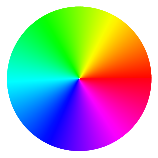

In [8]:
fig = plt.figure(figsize=(2, 2))
ax = fig.add_axes([0, 0, 1, 1], projection='polar')
cb = matplotlib.colorbar.ColorbarBase(
    ax=ax,
    cmap=matplotlib.cm.get_cmap('hsv', 2048),
    norm=matplotlib.colors.Normalize(0, 2 * np.pi),
    orientation='horizontal',
)
ax.get_children()[1].set_lw(0)
ax.axis('off')
plt.show()

In [9]:
sta = VelField(sta, name)

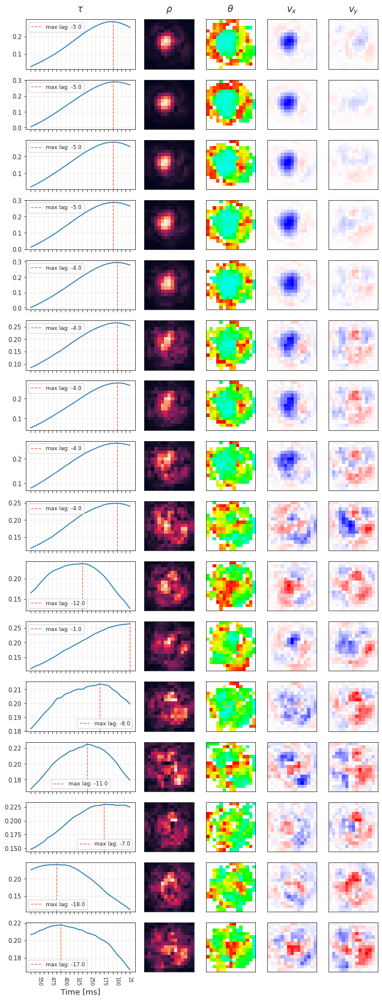

In [10]:
_ = sta.show()

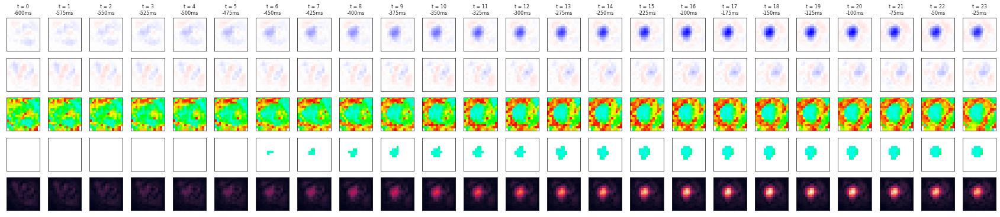

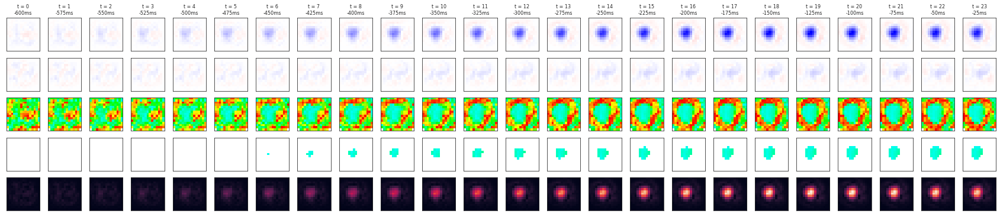

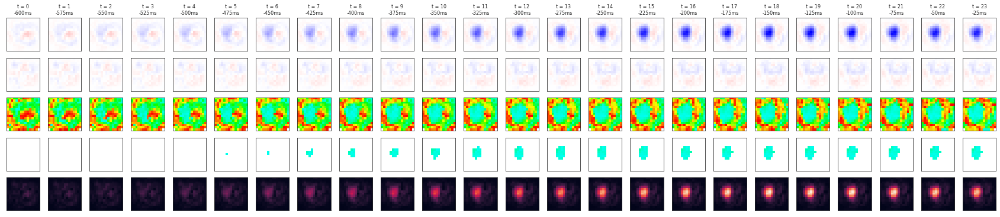

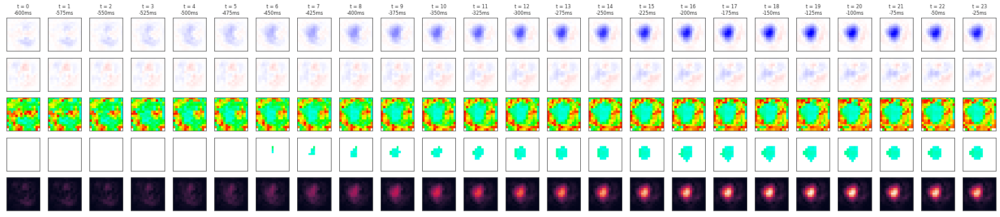

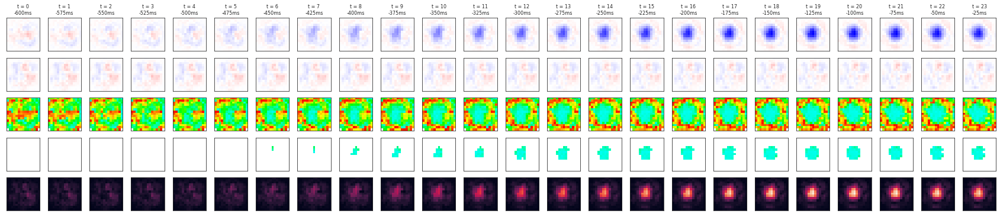

...

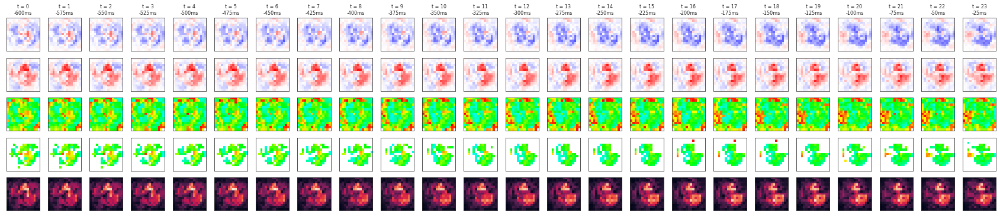

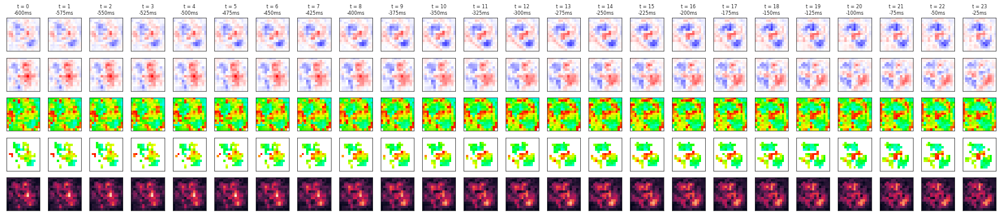

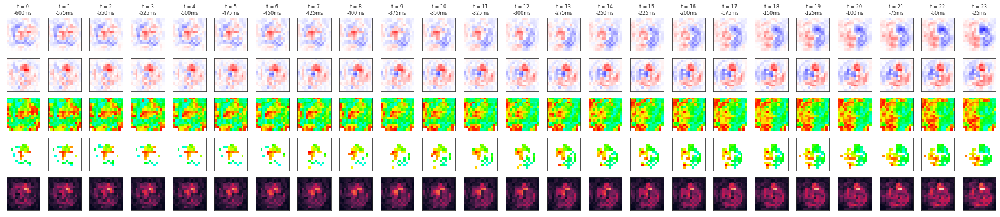

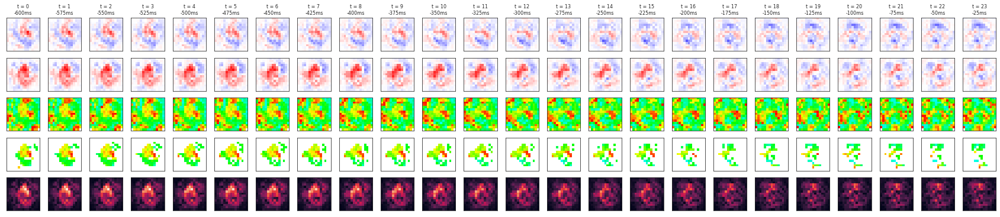

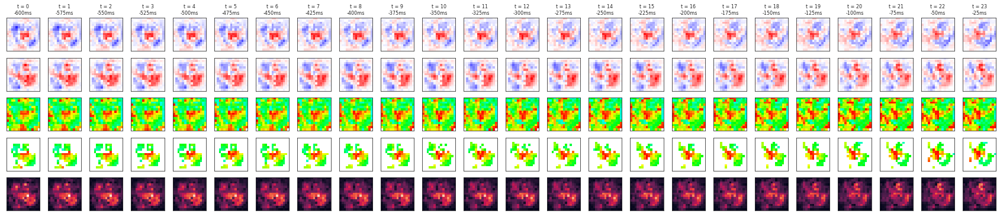

[<Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>,
 <Figure size 2160x432 with 120 Axes>]

In [11]:
sta.show_full()

In [12]:
s = sta.s / sta.s.sum(1, keepdims=True)
s.shape

(16, 24)

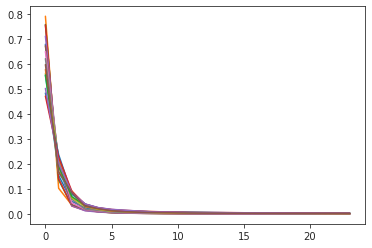

In [13]:
plt.plot(s.T);

In [14]:
np.round(s[:, 0] * 100, 1)

array([67.9, 79.1, 75.8, 75.6, 71.1, 67.3, 65. , 62.1, 56.3, 55.4, 48.4,
       57.8, 55.7, 47.2, 50.2, 59.8])

In [15]:
sta = compute_sta(24, good, stim, spks, True)
a = sta[4]
norm = np.linalg.norm(a, ord=2, axis=-1)
maxlag = np.argmax(norm.sum(-1).sum(-1))
maxlag

100%|██████████| 33951/33951 [00:11<00:00, 2872.27it/s]


20

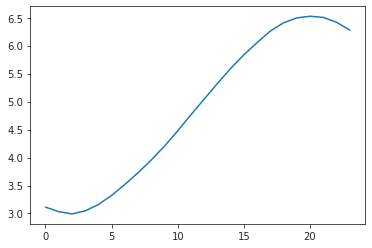

In [16]:
plt.plot(norm.sum(-1).sum(-1))

In [17]:
sta = compute_sta(100, good, stim, spks, True)
a = sta[4]
norm = np.linalg.norm(a, ord=2, axis=-1)
maxlag = np.argmax(norm.sum(-1).sum(-1))
maxlag

100%|██████████| 33904/33904 [01:06<00:00, 512.73it/s]


96

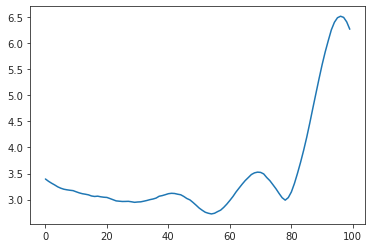

In [18]:
plt.plot(norm.sum(-1).sum(-1))

In [47]:
hf = HyperFlow(
    opticflow=np.array(group['hyperflow'])[:, 2:],
    center=np.array(group['hyperflow'])[:, :2],
    size=32,
    sres=2,
    radius=8,
)

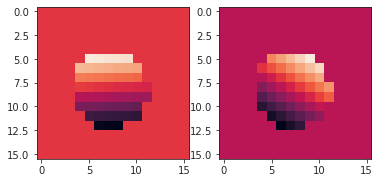

In [48]:
stim = hf.compute_hyperflow()

fig, axes = create_figure(1, 2)

axes[0].imshow(stim[2001, ..., 0])
axes[1].imshow(stim[2001, ..., 1])
plt.show()

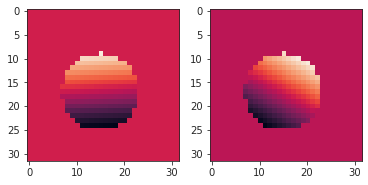

In [49]:
hf.setattrs(sres=1)
stim = hf.compute_hyperflow()

fig, axes = create_figure(1, 2)

axes[0].imshow(stim[2001, ..., 0])
axes[1].imshow(stim[2001, ..., 1])
plt.show()

In [50]:
sta = compute_sta(24, good, stim, spks, True)

100%|██████████| 33951/33951 [01:18<00:00, 429.86it/s]


In [51]:
sta = VelField(sta, 'sres=1')

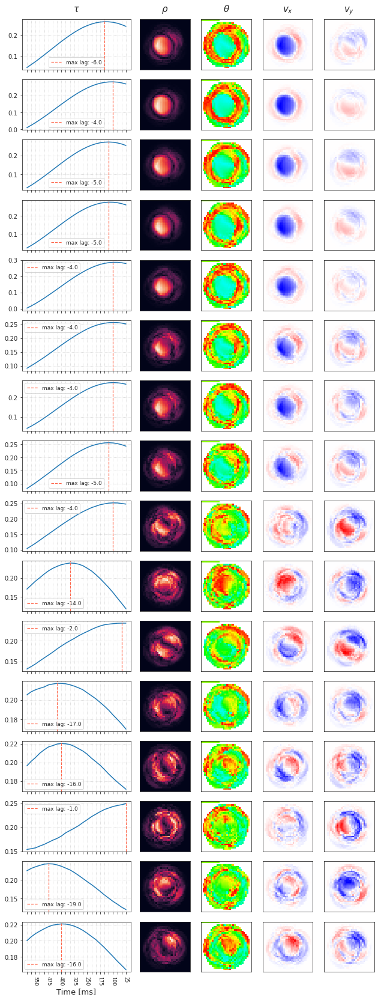

In [53]:
_ = sta.show()

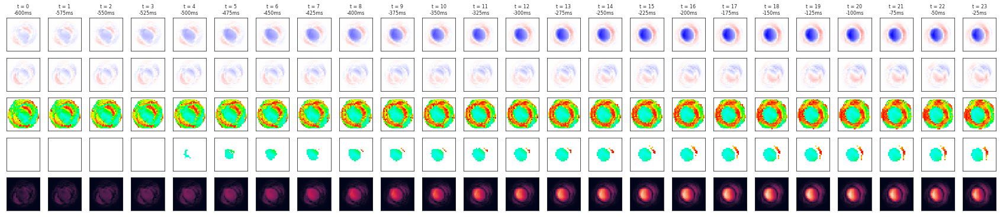

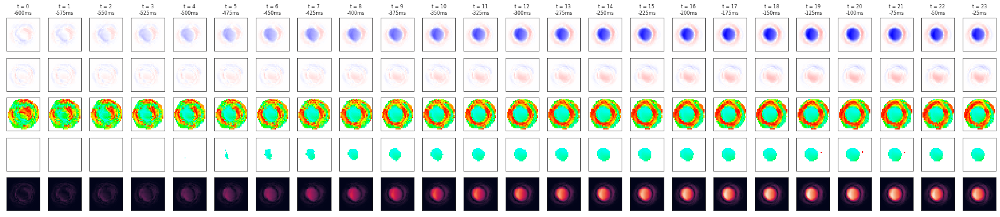

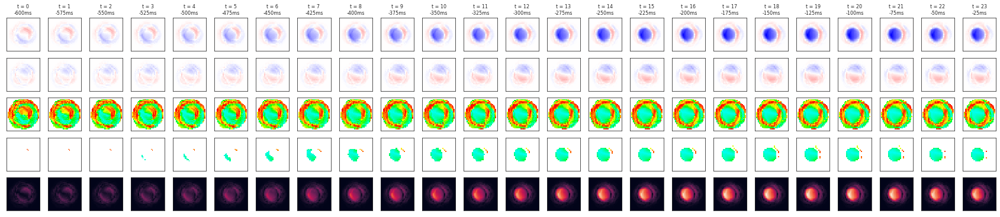

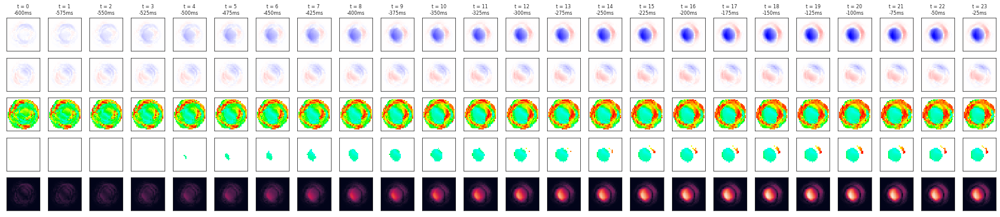

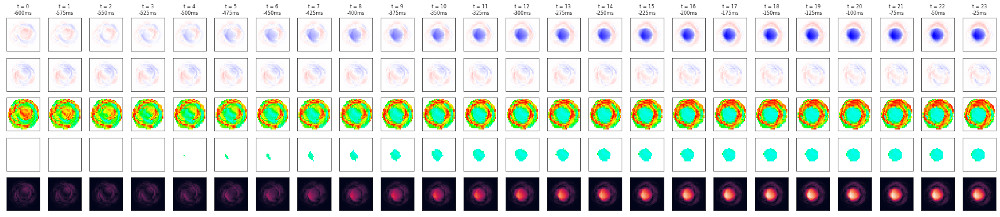

...

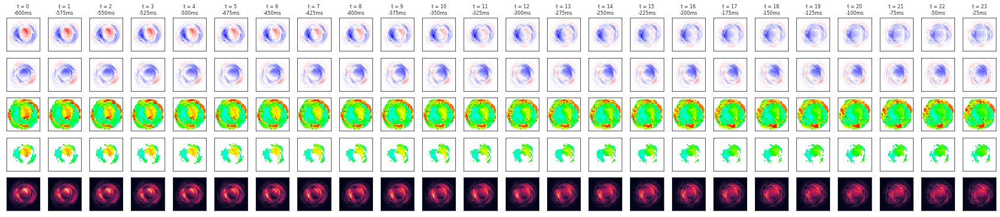

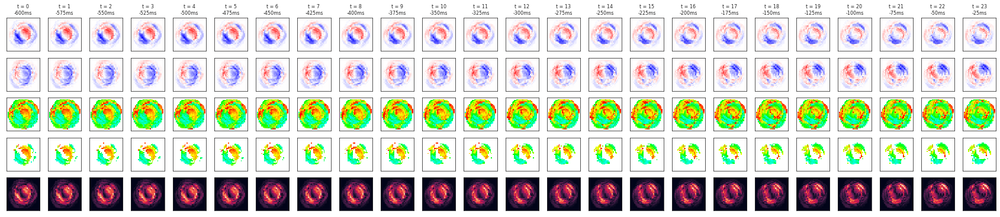

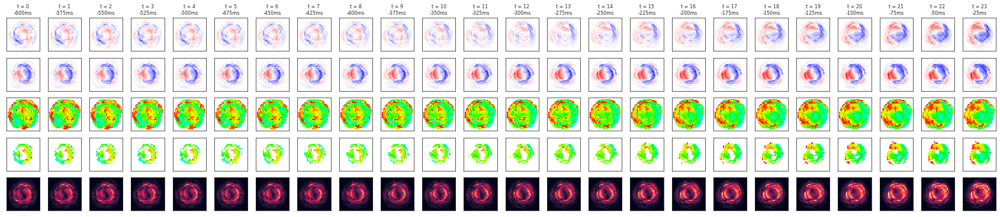

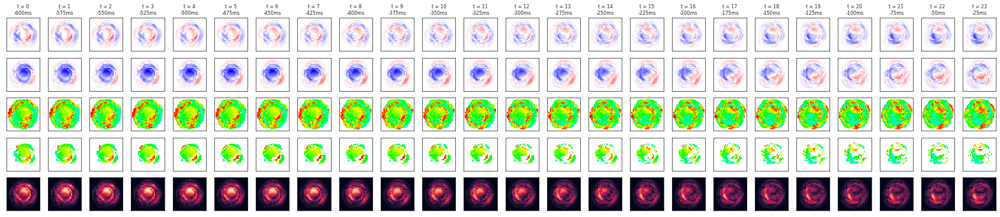

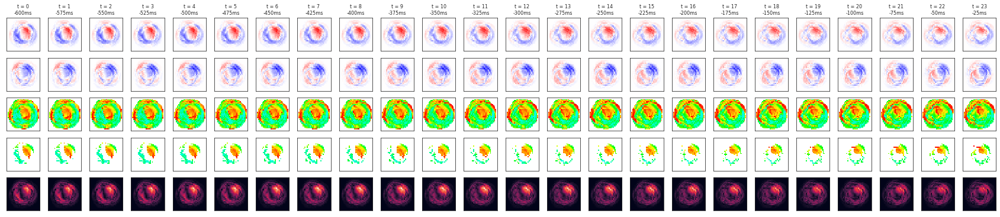

In [54]:
_ = sta.show_full()

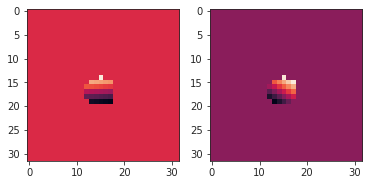

In [55]:
hf.setattrs(radius=3)
stim = hf.compute_hyperflow()

fig, axes = create_figure(1, 2)

axes[0].imshow(stim[2001, ..., 0])
axes[1].imshow(stim[2001, ..., 1])
plt.show()

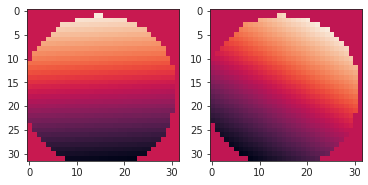

In [56]:
hf.setattrs(radius=16)
stim = hf.compute_hyperflow()

fig, axes = create_figure(1, 2)

axes[0].imshow(stim[2001, ..., 0])
axes[1].imshow(stim[2001, ..., 1])
plt.show()

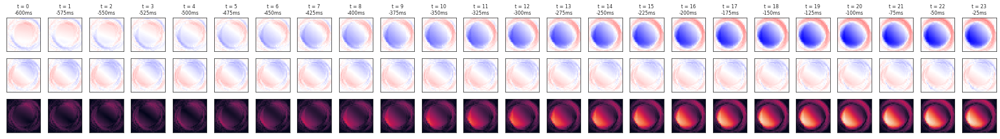

In [42]:
fig, axes = create_figure(3, 24, (30, 3.6), 'all', 'all')

vminmax = np.max(np.abs(a))
kws = {
    'cmap': 'bwr',
    'vmax': vminmax,
    'vmin': -vminmax,
}
for t in range(24):
    time = (t - 24) * 25
    axes[0, t].set_title(f't = {t}\n{time}ms', fontsize=8)
    axes[0, t].imshow(a[t][..., 0], **kws)
    axes[1, t].imshow(a[t][..., 1], **kws)
    axes[2, t].imshow(norm[t], vmin=np.min(norm), vmax=np.max(norm))
remove_ticks(axes, False)
plt.show()

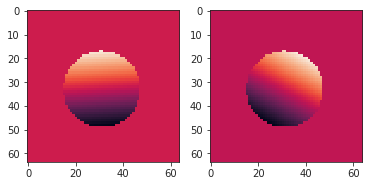

In [57]:
hf.setattrs(size=64, radius=16)
stim = hf.compute_hyperflow()

fig, axes = create_figure(1, 2)

axes[0].imshow(stim[2001, ..., 0])
axes[1].imshow(stim[2001, ..., 1])
plt.show()

In [58]:
sta = compute_sta(24, good, stim, spks, True)

100%|██████████| 33951/33951 [11:29<00:00, 49.23it/s]


In [59]:
sta = VelField(sta, 'size=64')

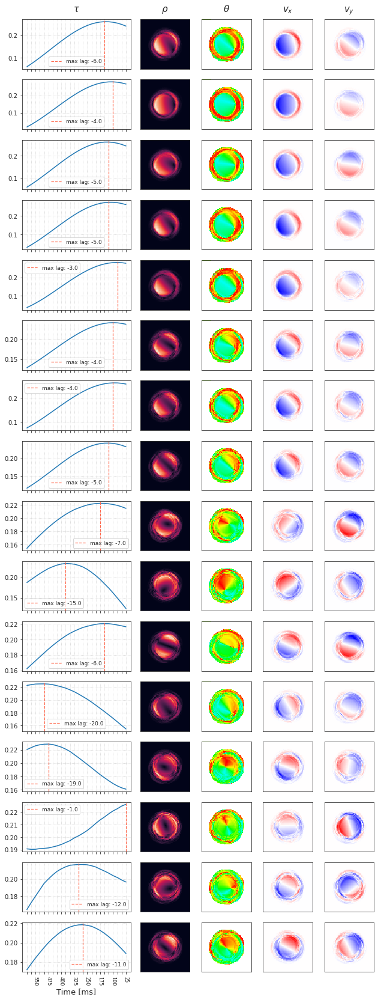

In [60]:
_ = sta.show()

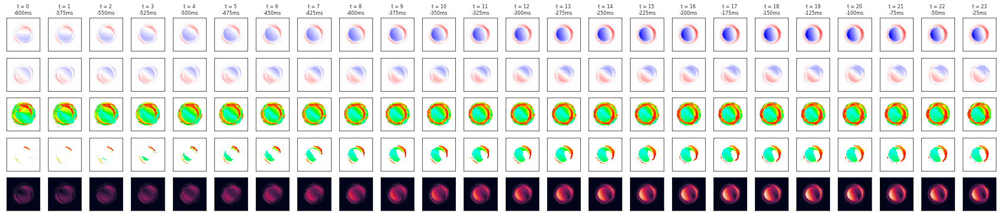

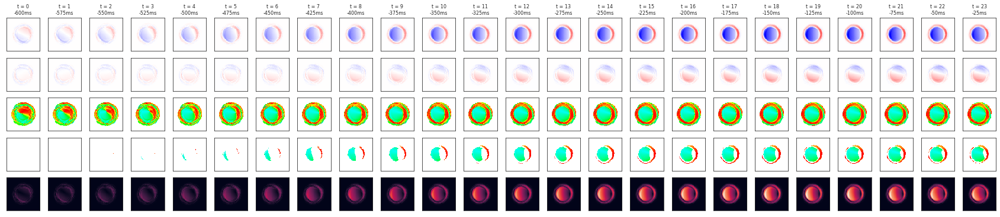

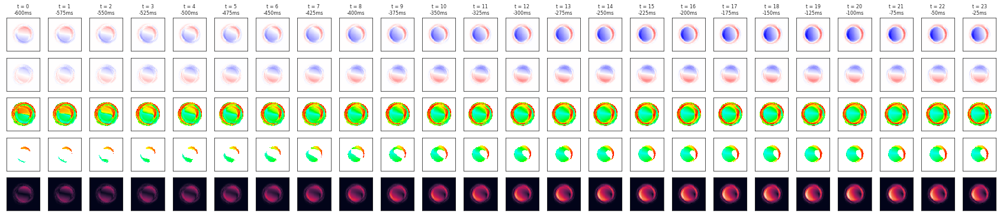

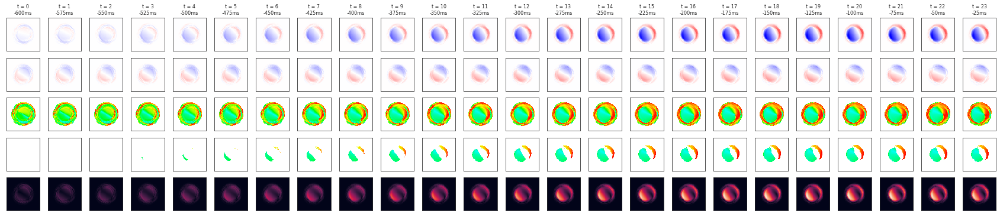

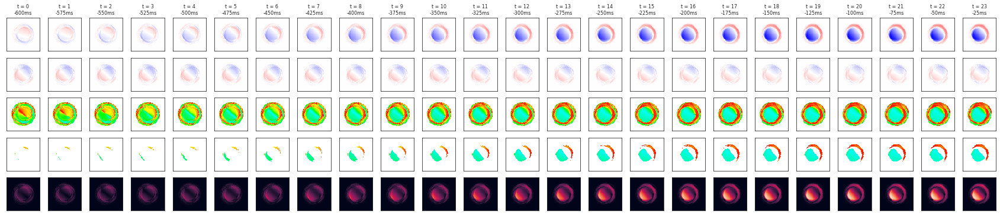

...

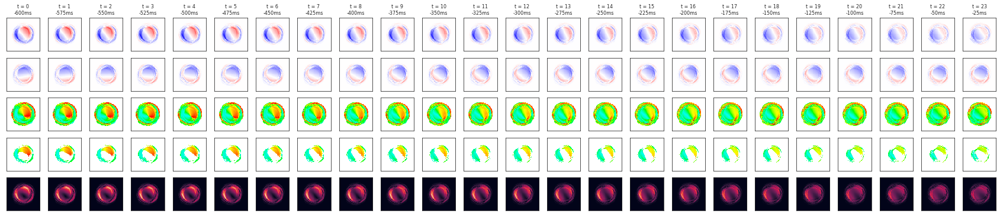

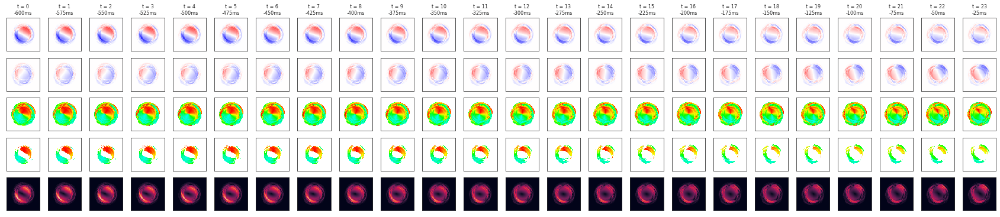

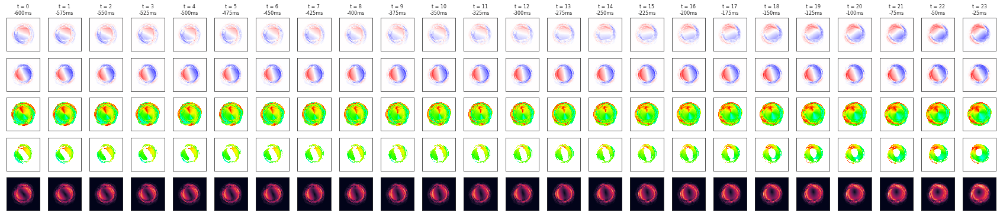

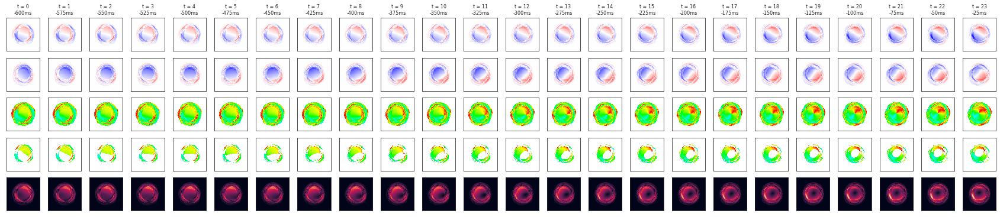

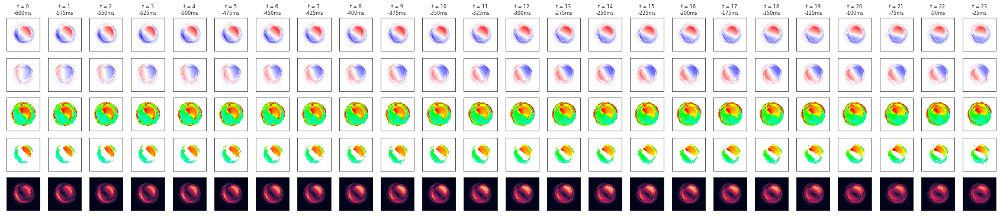

In [61]:
_ = sta.show_full()

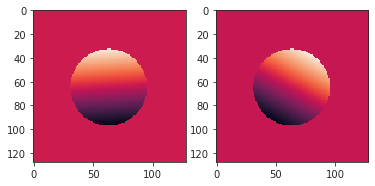

In [62]:
hf.setattrs(size=128, radius=32)
stim = hf.compute_hyperflow()

fig, axes = create_figure(1, 2)

axes[0].imshow(stim[2001, ..., 0])
axes[1].imshow(stim[2001, ..., 1])
plt.show()

In [50]:
stim = get_vel_field(
    opticflow=hyperflow[:, 2:],
    center=hyperflow[:, :2],
    size=128,
    sres=1,
    radius=28,
).reshape((-1, 128, 128, 2))
stim.shape

(43200, 128, 128, 2)

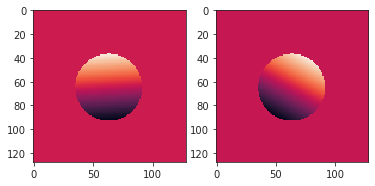

In [51]:
fig, axes = create_figure(1, 2)

axes[0].imshow(stim[2001, ..., 0])
axes[1].imshow(stim[2001, ..., 1])
plt.show()

## Firing rate plot

In [53]:
df = []
for i in range(spks.shape[1]):
    num = spks[:, i].sum(0)
    df.append({
        'cell': [i],
        'num_spk': [num],
        'fr': [num / (len(spks) * 25e-3)],
    })
df = pd.DataFrame(merge_dicts(df))

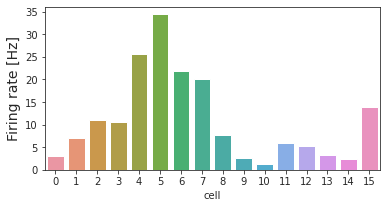

In [54]:
fig, ax = create_figure(1, 1, (6, 3))
sns.barplot(data=df, x='cell', y='fr', ax=ax)
ax.set_ylabel('Firing rate [Hz]', fontsize=14);

## Scratch

In [16]:
group['repeats']['spksR'].shape

(12040, 16)

In [17]:
12040 * 25e-3

301.0

In [19]:
group['repeats']['psth_raw_all'].shape

(16, 38, 201)

In [24]:
x = np.array(group['repeats']['hyperflowR'])
x.shape

(12040, 8)

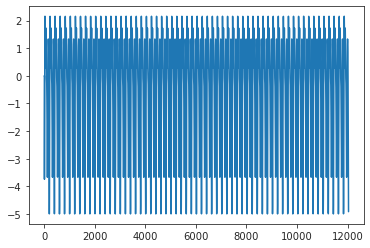

In [34]:
plt.plot(x[:, 5])

In [35]:
x = np.array(group['hyperflow'])
x.shape

(43200, 8)

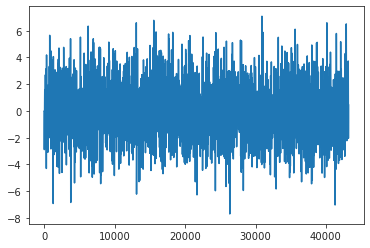

In [36]:
plt.plot(x[:, 5])

In [58]:
ptsh = np.array(group['repeats']['psth_raw_all'])
ptsh.shape

(16, 38, 201)

In [62]:
spks_r = np.array(group['repeats']['spksR'])
spks_r.shape

(12040, 16)

In [38]:
stim_r = np.array(group['repeats']['stimR'])
stim_r.shape

(12040, 15, 15, 2)

In [39]:
d = sp_dist.pdist(stim_r.reshape(len(stim_r), -1))

In [41]:
d = sp_dist.squareform(d)
d.shape

(12040, 12040)

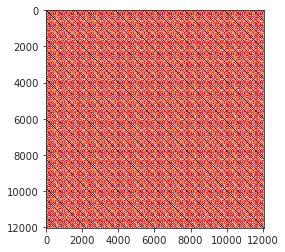

In [42]:
plt.imshow(d)

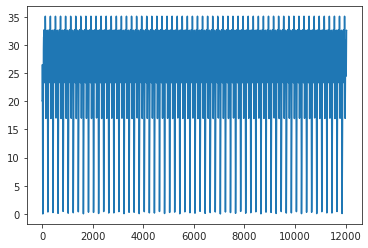

In [97]:
plt.plot(d[26])

In [98]:
(spks_r == -1).sum()

0

In [101]:
tstart = np.array(group['repeats']['tind_start_all'])[0]
tstart.shape

(38,)

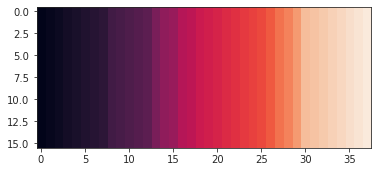

In [71]:
# plt.imshow(tstart)

In [103]:
tstart

array([   26,   226,   427,   628,   828,  1029,  1229,  1430,  2032,
        2233,  2433,  2634,  2834,  3637,  4239,  4440,  5242,  5443,
        5844,  6045,  6245,  6446,  6646,  6847,  7048,  7248,  7650,
        8251,  8653,  9255, 10258, 10458, 10659, 10860, 11060, 11261,
       11462, 11662])

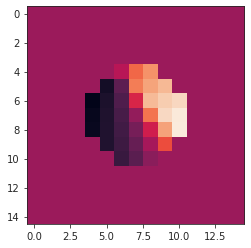

In [104]:
plt.imshow(stim_r[26, ..., 0])

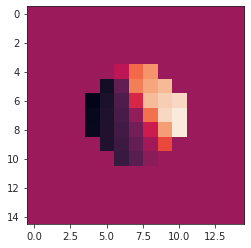

In [105]:
plt.imshow(stim_r[427, ..., 0])

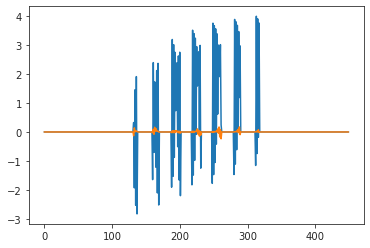

In [110]:
plt.plot(stim_r[26].ravel())
plt.plot(stim_r[26].ravel() - stim_r[226].ravel())